Problem statement: To build a CNN based model which can accurately detect melanoma. Melanoma is a type of cancer that can be deadly if not detected early. It accounts for 75% of skin cancer deaths. A solution which can evaluate images and alert the dermatologists about the presence of melanoma has the potential to reduce a lot of manual effort needed in diagnosis.

### Importing Skin Cancer Data
#### To do: Take necessary actions to read the data

### Importing all the important libraries

In [3]:
import pathlib
import tensorflow as tf
import matplotlib.pyplot as plt
import numpy as np
import pandas as pd
import os
import PIL
from tensorflow import keras
from tensorflow.keras import layers
from tensorflow.keras.models import Sequential

In [4]:
## If you are using the data by mounting the google drive, use the following :
from google.colab import drive
drive.mount('/content/gdrive')

##Ref:https://towardsdatascience.com/downloading-datasets-into-google-drive-via-google-colab-bcb1b30b0166

Mounted at /content/gdrive


This assignment uses a dataset of about 2357 images of skin cancer types. The dataset contains 9 sub-directories in each train and test subdirectories. The 9 sub-directories contains the images of 9 skin cancer types respectively.

In [38]:
# Defining the path for train and test images
## Todo: Update the paths of the train and test dataset
data_dir_train = pathlib.Path('/content/gdrive/MyDrive/DEV_CNN/ISIC/Train')
data_dir_test = pathlib.Path('/content/gdrive/MyDrive/DEV_CNN/ISIC/Test')

In [39]:
image_count_train = len(list(data_dir_train.glob('*/*.jpg')))
print(image_count_train)
image_count_test = len(list(data_dir_test.glob('*/*.jpg')))
print(image_count_test)

2239
118


### Load using keras.preprocessing

Let's load these images off disk using the helpful image_dataset_from_directory utility.

### Create a dataset

Define some parameters for the loader:

In [40]:
batch_size = 32
img_height = 180
img_width = 180

Use 80% of the images for training, and 20% for validation.

In [41]:
## Write your train dataset here
## Note use seed=123 while creating your dataset using tf.keras.preprocessing.image_dataset_from_directory
## Note, make sure your resize your images to the size img_height*img_width, while writting the dataset
train_ds = tf.keras.preprocessing.image_dataset_from_directory(data_dir_train,batch_size=batch_size,image_size=(img_width,img_height),label_mode='categorical',seed=123,subset="training",validation_split=0.2)



Found 6739 files belonging to 9 classes.
Using 5392 files for training.


In [42]:
## Write your validation dataset here
## Note use seed=123 while creating your dataset using tf.keras.preprocessing.image_dataset_from_directory
## Note, make sure your resize your images to the size img_height*img_width, while writting the dataset
val_ds = tf.keras.preprocessing.image_dataset_from_directory(data_dir_train,batch_size =batch_size, image_size= (img_width,img_height),label_mode='categorical',seed=123,subset="validation",validation_split=0.2)

Found 6739 files belonging to 9 classes.
Using 1347 files for validation.


In [43]:
# List out all the classes of skin cancer and store them in a list. 
# You can find the class names in the class_names attribute on these datasets. 
# These correspond to the directory names in alphabetical order.
class_names = train_ds.class_names
print(class_names)

['actinic keratosis', 'basal cell carcinoma', 'dermatofibroma', 'melanoma', 'nevus', 'pigmented benign keratosis', 'seborrheic keratosis', 'squamous cell carcinoma', 'vascular lesion']


### Visualize the data
#### Todo, create a code to visualize one instance of all the nine classes present in the dataset

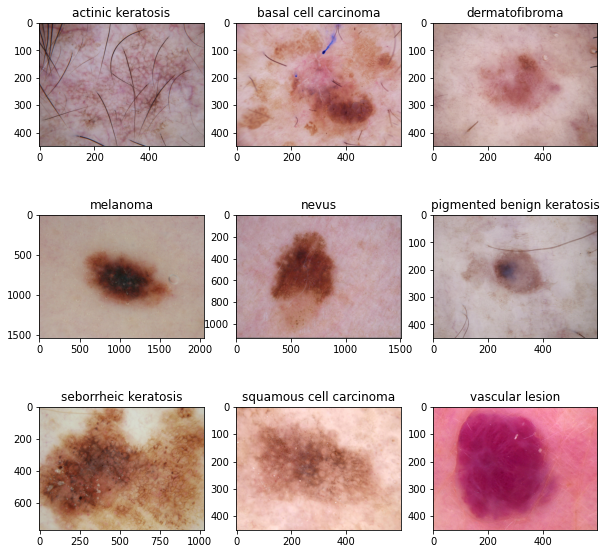

In [44]:
import matplotlib.pyplot as plt
plt.figure(figsize=(10,10))
for i in range(9): 
  plt.subplot(3, 3, i + 1)
  image = plt.imread(str(list(data_dir_train.glob(class_names[i]+'/*.jpg'))[1]))
  plt.title(class_names[i])
  plt.imshow(image)

The `image_batch` is a tensor of the shape `(32, 180, 180, 3)`. This is a batch of 32 images of shape `180x180x3` (the last dimension refers to color channels RGB). The `label_batch` is a tensor of the shape `(32,)`, these are corresponding labels to the 32 images.

`Dataset.cache()` keeps the images in memory after they're loaded off disk during the first epoch.

`Dataset.prefetch()` overlaps data preprocessing and model execution while training.

In [45]:
AUTOTUNE = tf.data.experimental.AUTOTUNE
train_ds = train_ds.cache().shuffle(1000).prefetch(buffer_size=AUTOTUNE)
val_ds = val_ds.cache().prefetch(buffer_size=AUTOTUNE)

### Create the model
#### Todo: Create a CNN model, which can accurately detect 9 classes present in the dataset. Use ```layers.experimental.preprocessing.Rescaling``` to normalize pixel values between (0,1). The RGB channel values are in the `[0, 255]` range. This is not ideal for a neural network. Here, it is good to standardize values to be in the `[0, 1]`

In [46]:
#CNN Model Architecture
model = Sequential()
#Rescaling
model.add(layers.experimental.preprocessing.Rescaling(1./255,input_shape=(180,180,3)))   
#First Convulation layer
model.add(layers.Conv2D(32,kernel_size=(3,3),activation='relu',padding = 'Same'))
#First Pooling layer
model.add(layers.MaxPool2D(pool_size=(2,2)))

#Second Convulation Layer
model.add(layers.Conv2D(64,kernel_size=(3,3),activation='relu',padding = 'Same'))
#Second Pooling Layer
model.add(layers.MaxPool2D(pool_size=(2,2)))

#Third Convulation Layer
model.add(layers.Conv2D(128,kernel_size=(3,3),activation='relu',padding = 'Same'))
#Third pooling Layer
model.add(layers.MaxPool2D(pool_size=(2,2)))
#Dropout layer with 50% Fraction of the input units to drop.
model.add(layers.Dropout(0.5))
#Flatten Layer
model.add(layers.Flatten())
#Dense Layer
model.add(layers.Dense(128,activation='relu'))
#Dropout layer with 25% Fraction of the input units to drop.
model.add(layers.Dropout(0.25))
#Dense Layer with softmax activation function.
model.add(layers.Dense(len(class_names),activation='softmax'))

model.summary()

Model: "sequential_3"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 rescaling_2 (Rescaling)     (None, 180, 180, 3)       0         
                                                                 
 conv2d_7 (Conv2D)           (None, 180, 180, 32)      896       
                                                                 
 max_pooling2d_6 (MaxPooling  (None, 90, 90, 32)       0         
 2D)                                                             
                                                                 
 conv2d_8 (Conv2D)           (None, 90, 90, 64)        18496     
                                                                 
 max_pooling2d_7 (MaxPooling  (None, 45, 45, 64)       0         
 2D)                                                             
                                                                 
 conv2d_9 (Conv2D)           (None, 45, 45, 128)      

### Compile the model
Choose an appropirate optimiser and loss function for model training 

In [47]:
### Todo, choose an appropirate optimiser and loss function
model.compile(optimizer='Adam',
              loss=tf.keras.losses.CategoricalCrossentropy(from_logits=False),
              metrics=['accuracy'])

In [48]:
# View the summary of all layers
model.summary()

Model: "sequential_3"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 rescaling_2 (Rescaling)     (None, 180, 180, 3)       0         
                                                                 
 conv2d_7 (Conv2D)           (None, 180, 180, 32)      896       
                                                                 
 max_pooling2d_6 (MaxPooling  (None, 90, 90, 32)       0         
 2D)                                                             
                                                                 
 conv2d_8 (Conv2D)           (None, 90, 90, 64)        18496     
                                                                 
 max_pooling2d_7 (MaxPooling  (None, 45, 45, 64)       0         
 2D)                                                             
                                                                 
 conv2d_9 (Conv2D)           (None, 45, 45, 128)      

### Train the model

In [49]:
epochs = 20
history = model.fit(
  train_ds,
  validation_data=val_ds,
  epochs=epochs
)

Epoch 1/20
169/169 [==============================] - 35s 75ms/step - loss: 1.9311 - accuracy: 0.2726 - val_loss: 1.6069 - val_accuracy: 0.3608
Epoch 2/20
169/169 [==============================] - 7s 41ms/step - loss: 1.6072 - accuracy: 0.3913 - val_loss: 1.5222 - val_accuracy: 0.4514
Epoch 3/20
169/169 [==============================] - 7s 41ms/step - loss: 1.3945 - accuracy: 0.4698 - val_loss: 1.2850 - val_accuracy: 0.5204
Epoch 4/20
169/169 [==============================] - 7s 41ms/step - loss: 1.2358 - accuracy: 0.5406 - val_loss: 1.1351 - val_accuracy: 0.5642
Epoch 5/20
169/169 [==============================] - 7s 41ms/step - loss: 1.0934 - accuracy: 0.5933 - val_loss: 0.9959 - val_accuracy: 0.6169
Epoch 6/20
169/169 [==============================] - 7s 41ms/step - loss: 1.0499 - accuracy: 0.6165 - val_loss: 1.0155 - val_accuracy: 0.6140
Epoch 7/20
169/169 [==============================] - 7s 41ms/step - loss: 0.9097 - accuracy: 0.6634 - val_loss: 1.0183 - val_accuracy: 0.647

### Visualizing training results

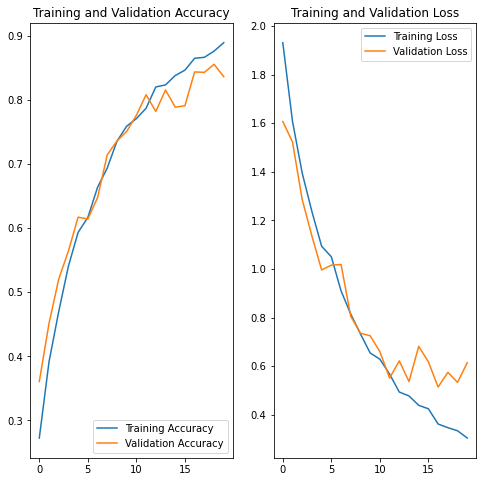

In [50]:
acc = history.history['accuracy']
val_acc = history.history['val_accuracy']

loss = history.history['loss']
val_loss = history.history['val_loss']

epochs_range = range(epochs)

plt.figure(figsize=(8, 8))
plt.subplot(1, 2, 1)
plt.plot(epochs_range, acc, label='Training Accuracy')
plt.plot(epochs_range, val_acc, label='Validation Accuracy')
plt.legend(loc='lower right')
plt.title('Training and Validation Accuracy')

plt.subplot(1, 2, 2)
plt.plot(epochs_range, loss, label='Training Loss')
plt.plot(epochs_range, val_loss, label='Validation Loss')
plt.legend(loc='upper right')
plt.title('Training and Validation Loss')
plt.show()

#### Todo: Write your findings after the model fit, see if there is an evidence of model overfit or underfit

### First Model analysis 


*   By seeing the garph we can clearly say that model created by base data is overfitted model.
*   Accuracy is around 70-75%



In [51]:
# Todo, after you have analysed the model fit history for presence of underfit or overfit, choose an appropriate data augumentation strategy. 
 
# Your code goes here
data_augument = keras.Sequential([
                             layers.experimental.preprocessing.RandomFlip(mode="horizontal_and_vertical",input_shape=(img_height,img_width,3)),
                             layers.experimental.preprocessing.RandomRotation(0.2, fill_mode='reflect'),
                             layers.experimental.preprocessing.RandomZoom(height_factor=(0.2, 0.3), width_factor=(0.2, 0.3), fill_mode='reflect')
])

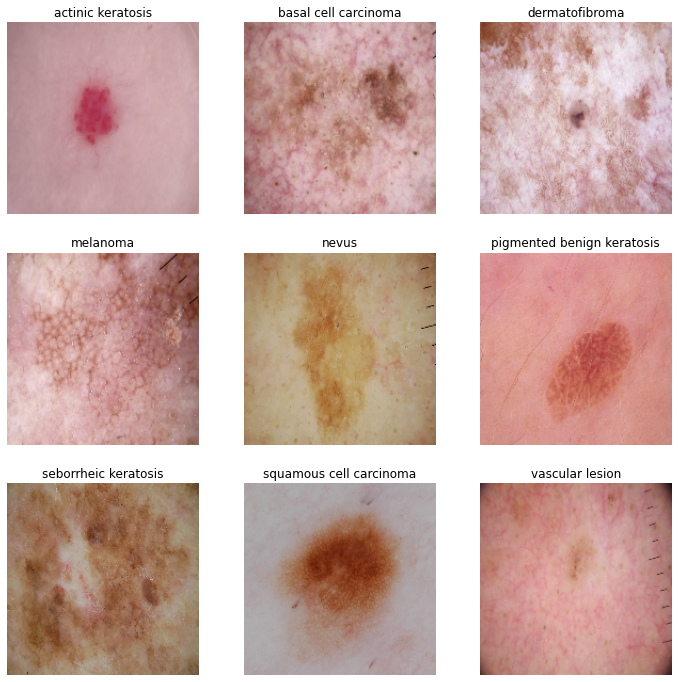

In [52]:
# Todo, visualize how your augmentation strategy works for one instance of training image.
# Your code goes here

plt.figure(figsize=(12, 12))
for images, labels in train_ds.take(1):
    for i in range(9):
        ax = plt.subplot(3, 3, i + 1)
        plt.imshow(data_augument(images)[i].numpy().astype("uint8"))
        plt.title(class_names[i])
        plt.axis("off")

### Todo:
### Create the model, compile and train the model


In [53]:
## You can use Dropout layer if there is an evidence of overfitting in your findings

## Your code goes here


## You can use Dropout layer if there is an evidence of overfitting in your findings
from keras.layers import Dense, Dropout, Flatten, Conv2D, MaxPool2D
num_classes = 9
model = Sequential([ data_augument,
                    layers.experimental.preprocessing.Rescaling(1./255, input_shape=(img_height, img_width,3))
      
])
model.add(Conv2D(filters = 32, kernel_size = (5,5),padding = 'Same', 
                 activation ='relu', input_shape = (180, 180, 32)))
model.add(Conv2D(filters = 32, kernel_size = (5,5),padding = 'Same', 
                 activation ='relu'))
model.add(MaxPool2D(pool_size=(2,2)))
model.add(Conv2D(filters = 64, kernel_size = (5,5),padding = 'Same', 
                 activation ='relu'))
model.add(MaxPool2D(pool_size=(2,2)))
model.add(Conv2D(filters = 64, kernel_size = (5,5),padding = 'Same', 
                 activation ='relu'))
model.add(MaxPool2D(pool_size=(2,2)))
model.add(Dropout(0.25))


model.add(Flatten())
model.add(Dense(num_classes, activation = "softmax"))


### Compiling the model

In [54]:
## Your code goes here
model.compile(optimizer='Adam',
              loss=tf.keras.losses.CategoricalCrossentropy(from_logits=False),
              metrics=['accuracy'])

### Training the model

In [55]:
## Your code goes here, note: train your model for 20 epochs
epochs=20
history = model.fit(
  train_ds,
  validation_data=val_ds,
  epochs=epochs
)

Epoch 1/20
169/169 [==============================] - 17s 92ms/step - loss: 2.1202 - accuracy: 0.1875 - val_loss: 2.0094 - val_accuracy: 0.2094
Epoch 2/20
169/169 [==============================] - 14s 84ms/step - loss: 2.1203 - accuracy: 0.1756 - val_loss: 2.0142 - val_accuracy: 0.2160
Epoch 3/20
169/169 [==============================] - 14s 84ms/step - loss: 1.9605 - accuracy: 0.2389 - val_loss: 1.8474 - val_accuracy: 0.2561
Epoch 4/20
169/169 [==============================] - 14s 85ms/step - loss: 1.8411 - accuracy: 0.2723 - val_loss: 1.7436 - val_accuracy: 0.3036
Epoch 5/20
169/169 [==============================] - 14s 84ms/step - loss: 1.7878 - accuracy: 0.2969 - val_loss: 2.0055 - val_accuracy: 0.2843
Epoch 6/20
169/169 [==============================] - 14s 85ms/step - loss: 1.7195 - accuracy: 0.3290 - val_loss: 1.6762 - val_accuracy: 0.2977
Epoch 7/20
169/169 [==============================] - 14s 85ms/step - loss: 1.6597 - accuracy: 0.3483 - val_loss: 1.7032 - val_accuracy:

### Visualizing the results

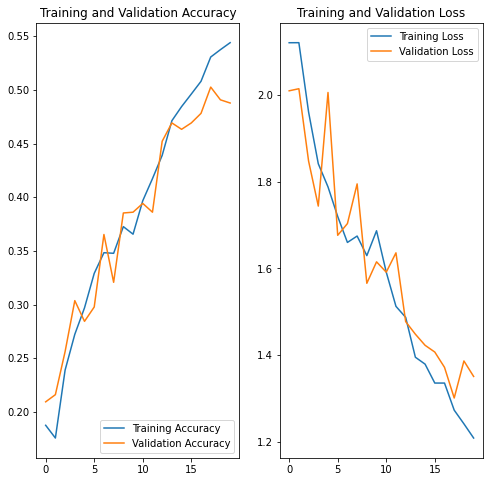

In [56]:
acc = history.history['accuracy']
val_acc = history.history['val_accuracy']

loss = history.history['loss']
val_loss = history.history['val_loss']

epochs_range = range(epochs)

plt.figure(figsize=(8, 8))
plt.subplot(1, 2, 1)
plt.plot(epochs_range, acc, label='Training Accuracy')
plt.plot(epochs_range, val_acc, label='Validation Accuracy')
plt.legend(loc='lower right')
plt.title('Training and Validation Accuracy')

plt.subplot(1, 2, 2)
plt.plot(epochs_range, loss, label='Training Loss')
plt.plot(epochs_range, val_loss, label='Validation Loss')
plt.legend(loc='upper right')
plt.title('Training and Validation Loss')
plt.show()

#### Todo: Write your findings after the model fit, see if there is an evidence of model overfit or underfit. Do you think there is some improvement now as compared to the previous model run?

**Finding** : 


*   we can clearly see that overfitting issue has been removed due to data augmentation.



#### **Todo:** Find the distribution of classes in the training dataset.
#### **Context:** Many times real life datasets can have class imbalance, one class can have proportionately higher number of samples compared to the others. Class imbalance can have a detrimental effect on the final model quality. Hence as a sanity check it becomes important to check what is the distribution of classes in the data.

In [57]:
## Your code goes here.
##
pd.set_option('max_rows', 99999)
pd.set_option('max_colwidth', 400)
path_list=[]
lesion_list=[]
for i in class_names:      
    for j in data_dir_train.glob(i+'/*.jpg'):
        path_list.append(str(j))
        lesion_list.append(i)
dataframe_dict_original = dict(zip(path_list, lesion_list))
original_df = pd.DataFrame(list(dataframe_dict_original.items()),columns = ['Path','Label'])
original_df


,Path,Label
0,/content/gdrive/MyDrive/DEV_CNN/ISIC/Train/actinic keratosis/ISIC_0025780.jpg,actinic keratosis
1,/content/gdrive/MyDrive/DEV_CNN/ISIC/Train/actinic keratosis/ISIC_0025803.jpg,actinic keratosis
2,/content/gdrive/MyDrive/DEV_CNN/ISIC/Train/actinic keratosis/ISIC_0025825.jpg,actinic keratosis
3,/content/gdrive/MyDrive/DEV_CNN/ISIC/Train/actinic keratosis/ISIC_0025953.jpg,actinic keratosis
4,/content/gdrive/MyDrive/DEV_CNN/ISIC/Train/actinic keratosis/ISIC_0025957.jpg,actinic keratosis
5,/content/gdrive/MyDrive/DEV_CNN/ISIC/Train/actinic keratosis/ISIC_0025992.jpg,actinic keratosis
6,/content/gdrive/MyDrive/DEV_CNN/ISIC/Train/actinic keratosis/ISIC_0026040.jpg,actinic keratosis
7,/content/gdrive/MyDrive/DEV_CNN/ISIC/Train/actinic keratosis/ISIC_0026149.jpg,actinic keratosis
8,/content/gdrive/MyDrive/DEV_CNN/ISIC/Train/actinic keratosis/ISIC_0026171.jpg,actinic keratosis
9,/content/gdrive/MyDrive/DEV_CNN/ISIC/Train/actinic keratosis/ISIC_0026194.jpg,actinic keratosis


<BarContainer object of 9 artists>

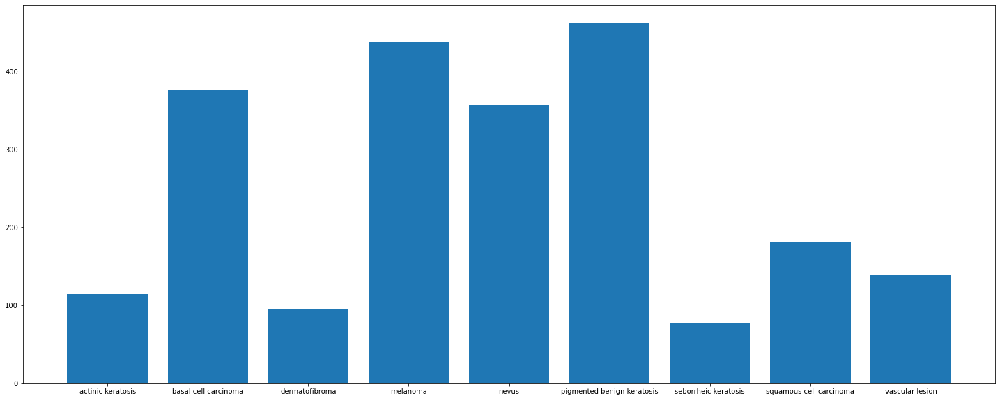

In [58]:
count=[]
for i in class_names:
    count.append(len(list(data_dir_train.glob(i+'/*.jpg'))))
plt.figure(figsize=(25,10))
plt.bar(class_names,count)

#### **Todo:** Write your findings here: 
#### - Which class has the least number of samples?
**Answer:** **seborrheic keratosis** has least number of samples

#### - Which classes dominate the data in terms proportionate number of samples?
**Answer:**- **melanoma, pigmented benign keratosis, nervus and basal cell carcinoma** have proportionate number of samples.


#### **Todo:** Rectify the class imbalance
#### **Context:** You can use a python package known as `Augmentor` (https://augmentor.readthedocs.io/en/master/) to add more samples across all classes so that none of the classes have very few samples.

In [59]:
!pip install Augmentor

Looking in indexes: https://pypi.org/simple, https://us-python.pkg.dev/colab-wheels/public/simple/


To use `Augmentor`, the following general procedure is followed:

1. Instantiate a `Pipeline` object pointing to a directory containing your initial image data set.<br>
2. Define a number of operations to perform on this data set using your `Pipeline` object.<br>
3. Execute these operations by calling the `Pipeline’s` `sample()` method.


In [60]:
path_to_training_dataset="To do"
import Augmentor
for i in class_names:
    p = Augmentor.Pipeline(data_dir_train /i,save_format='jpg')
    p.rotate(probability=0.7, max_left_rotation=10, max_right_rotation=10)
    p.sample(500) ## We are adding 500 samples per class to make sure that none of the classes are sparse.

Initialised with 114 image(s) found.
Output directory set to /content/gdrive/MyDrive/DEV_CNN/ISIC/Train/actinic keratosis/output.

Processing <PIL.JpegImagePlugin.JpegImageFile image mode=RGB size=600x450 at 0x7F411ADF8850>: 100%|██████████| 500/500 [00:20<00:00, 24.24 Samples/s]


Initialised with 376 image(s) found.
Output directory set to /content/gdrive/MyDrive/DEV_CNN/ISIC/Train/basal cell carcinoma/output.

Processing <PIL.Image.Image image mode=RGB size=600x450 at 0x7F407DE81190>: 100%|██████████| 500/500 [00:22<00:00, 22.66 Samples/s]


Initialised with 95 image(s) found.
Output directory set to /content/gdrive/MyDrive/DEV_CNN/ISIC/Train/dermatofibroma/output.

Processing <PIL.JpegImagePlugin.JpegImageFile image mode=RGB size=600x450 at 0x7F411ACED850>: 100%|██████████| 500/500 [00:21<00:00, 23.44 Samples/s]


Initialised with 438 image(s) found.
Output directory set to /content/gdrive/MyDrive/DEV_CNN/ISIC/Train/melanoma/output.

Processing <PIL.Image.Image image mode=RGB size=1024x768 at 0x7F40893CBC90>: 100%|██████████| 500/500 [01:43<00:00,  4.85 Samples/s]


Initialised with 357 image(s) found.
Output directory set to /content/gdrive/MyDrive/DEV_CNN/ISIC/Train/nevus/output.

Processing <PIL.JpegImagePlugin.JpegImageFile image mode=RGB size=767x576 at 0x7F411AC7C0D0>: 100%|██████████| 500/500 [01:23<00:00,  6.00 Samples/s]


Initialised with 462 image(s) found.
Output directory set to /content/gdrive/MyDrive/DEV_CNN/ISIC/Train/pigmented benign keratosis/output.

Processing <PIL.Image.Image image mode=RGB size=600x450 at 0x7F411ACED710>: 100%|██████████| 500/500 [00:18<00:00, 27.77 Samples/s]


Initialised with 77 image(s) found.
Output directory set to /content/gdrive/MyDrive/DEV_CNN/ISIC/Train/seborrheic keratosis/output.

Processing <PIL.Image.Image image mode=RGB size=1024x768 at 0x7F411AD0A650>: 100%|██████████| 500/500 [00:43<00:00, 11.61 Samples/s]


Initialised with 181 image(s) found.
Output directory set to /content/gdrive/MyDrive/DEV_CNN/ISIC/Train/squamous cell carcinoma/output.

Processing <PIL.Image.Image image mode=RGB size=600x450 at 0x7F4088CB5650>: 100%|██████████| 500/500 [00:18<00:00, 26.99 Samples/s]


Initialised with 139 image(s) found.
Output directory set to /content/gdrive/MyDrive/DEV_CNN/ISIC/Train/vascular lesion/output.

Processing <PIL.Image.Image image mode=RGB size=600x450 at 0x7F4088605FD0>: 100%|██████████| 500/500 [00:18<00:00, 27.05 Samples/s]


In [61]:
image_count_train1 = len(list(data_dir_train.glob('**/*.jpg')))
print(image_count_train1)


11239


In [62]:
##
import glob
from pathlib import Path

# search all files inside a specific folder
# *.* means file name with any extension
for i in class_names:
  for path in Path(data_dir_train /i).rglob('*.jpg'):
    path_list.append(path.resolve())    
    lesion_list.append(i)
dataframe_dict_original = dict(zip(path_list, lesion_list))
new_df = pd.DataFrame(list(dataframe_dict_original.items()),columns = ['Path','Label'])
new_df

,Path,Label
0,/content/gdrive/MyDrive/DEV_CNN/ISIC/Train/actinic keratosis/ISIC_0025780.jpg,actinic keratosis
1,/content/gdrive/MyDrive/DEV_CNN/ISIC/Train/actinic keratosis/ISIC_0025803.jpg,actinic keratosis
2,/content/gdrive/MyDrive/DEV_CNN/ISIC/Train/actinic keratosis/ISIC_0025825.jpg,actinic keratosis
3,/content/gdrive/MyDrive/DEV_CNN/ISIC/Train/actinic keratosis/ISIC_0025953.jpg,actinic keratosis
4,/content/gdrive/MyDrive/DEV_CNN/ISIC/Train/actinic keratosis/ISIC_0025957.jpg,actinic keratosis
5,/content/gdrive/MyDrive/DEV_CNN/ISIC/Train/actinic keratosis/ISIC_0025992.jpg,actinic keratosis
6,/content/gdrive/MyDrive/DEV_CNN/ISIC/Train/actinic keratosis/ISIC_0026040.jpg,actinic keratosis
7,/content/gdrive/MyDrive/DEV_CNN/ISIC/Train/actinic keratosis/ISIC_0026149.jpg,actinic keratosis
8,/content/gdrive/MyDrive/DEV_CNN/ISIC/Train/actinic keratosis/ISIC_0026171.jpg,actinic keratosis
9,/content/gdrive/MyDrive/DEV_CNN/ISIC/Train/actinic keratosis/ISIC_0026194.jpg,actinic keratosis


Augmentor has stored the augmented images in the output sub-directory of each of the sub-directories of skin cancer types.. Lets take a look at total count of augmented images.

In [63]:
image_count_train = len(list(data_dir_train.glob('*/output/*.jpg')))
print(image_count_train)

9000


### Lets see the distribution of augmented data after adding new images to the original training data.

In [68]:
new_df['Label'].value_counts()

pigmented benign keratosis    1924
melanoma                      1876
basal cell carcinoma          1752
nevus                         1714
squamous cell carcinoma       1362
vascular lesion               1278
actinic keratosis             1228
dermatofibroma                1190
seborrheic keratosis          1154
Name: Label, dtype: int64

So, now we have added 500 images to all the classes to maintain some class balance. We can add more images as we want to improve training process.

#### **Todo**: Train the model on the data created using Augmentor

In [70]:
batch_size = 32
img_height = 180
img_width = 180

#### **Todo:** Create a training dataset

In [74]:
data_dir_train="/content/gdrive/MyDrive/DEV_CNN/ISIC/Train"
train_ds = tf.keras.preprocessing.image_dataset_from_directory(
  data_dir_train,
  seed=123,
  validation_split = 0.2,
  subset = "training",
  image_size=(img_height, img_width),
  batch_size=batch_size)

Found 11239 files belonging to 9 classes.
Using 8992 files for training.


#### **Todo:** Create a validation dataset

In [76]:
val_ds = tf.keras.preprocessing.image_dataset_from_directory(
  data_dir_train,
  seed=123,
  validation_split = 0.2,
  subset = 'validation',
  image_size=(img_height, img_width),
  batch_size=batch_size)

Found 11239 files belonging to 9 classes.
Using 2247 files for validation.


#### **Todo:** Create your model (make sure to include normalization)

In [77]:
## your code goes here
from keras.layers import Dense, Dropout, Flatten, Conv2D, MaxPool2D, BatchNormalization
num_classes = 9
model = Sequential([ 
                    layers.experimental.preprocessing.Rescaling(1./255, input_shape=(img_height, img_width,3))
      
])
BatchNormalization()
model.add(Conv2D(filters = 32, kernel_size = (5,5),padding = 'Same', 
                 activation ='relu', input_shape = (180, 180, 32)))
model.add(Conv2D(filters = 32, kernel_size = (5,5),padding = 'Same', 
                 activation ='relu'))
model.add(MaxPool2D(pool_size=(2,2)))
model.add(Conv2D(filters = 64, kernel_size = (5,5),padding = 'Same', 
                 activation ='relu'))
model.add(MaxPool2D(pool_size=(2,2)))
model.add(Conv2D(filters = 64, kernel_size = (5,5),padding = 'Same', 
                 activation ='relu'))
model.add(MaxPool2D(pool_size=(2,2)))
model.add(Dropout(0.25))


model.add(Flatten())
model.add(Dense(num_classes, activation = "softmax"))

#### **Todo:** Compile your model (Choose optimizer and loss function appropriately)

In [78]:
## your code goes here
model.compile(optimizer='adam',
              loss=tf.keras.losses.SparseCategoricalCrossentropy(from_logits=False),
              metrics=['accuracy'])

#### **Todo:**  Train your model

In [79]:
epochs = 50
## Your code goes here, use 50 epochs.
history = history = model.fit(
  train_ds,
  validation_data=val_ds,
  epochs=epochs
)

Epoch 1/50
281/281 [==============================] - 52s 179ms/step - loss: 1.9393 - accuracy: 0.2411 - val_loss: 1.5930 - val_accuracy: 0.3930
Epoch 2/50
281/281 [==============================] - 51s 180ms/step - loss: 1.5712 - accuracy: 0.3977 - val_loss: 1.4591 - val_accuracy: 0.4406
Epoch 3/50
281/281 [==============================] - 50s 175ms/step - loss: 1.3792 - accuracy: 0.4750 - val_loss: 1.3078 - val_accuracy: 0.5136
Epoch 4/50
281/281 [==============================] - 51s 179ms/step - loss: 1.2204 - accuracy: 0.5338 - val_loss: 1.2232 - val_accuracy: 0.5496
Epoch 5/50
281/281 [==============================] - 50s 175ms/step - loss: 1.0687 - accuracy: 0.6006 - val_loss: 1.0885 - val_accuracy: 0.5946
Epoch 6/50
281/281 [==============================] - 50s 174ms/step - loss: 0.9104 - accuracy: 0.6649 - val_loss: 0.9043 - val_accuracy: 0.6702
Epoch 7/50
281/281 [==============================] - 50s 175ms/step - loss: 0.7532 - accuracy: 0.7270 - val_loss: 0.9070 - val_ac

#### **Todo:**  Visualize the model results

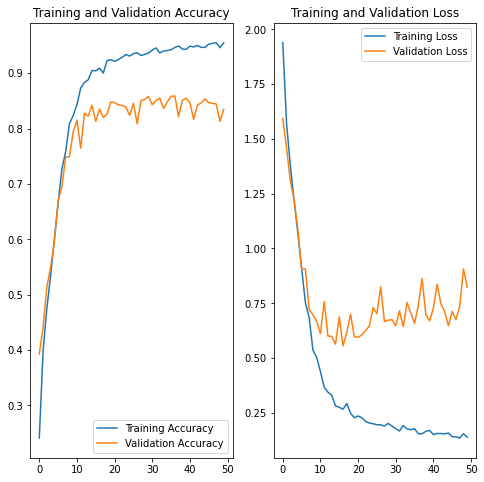

In [80]:
acc = history.history['accuracy']
val_acc = history.history['val_accuracy']

loss = history.history['loss']
val_loss = history.history['val_loss']

epochs_range = range(epochs)

plt.figure(figsize=(8, 8))
plt.subplot(1, 2, 1)
plt.plot(epochs_range, acc, label='Training Accuracy')
plt.plot(epochs_range, val_acc, label='Validation Accuracy')
plt.legend(loc='lower right')
plt.title('Training and Validation Accuracy')

plt.subplot(1, 2, 2)
plt.plot(epochs_range, loss, label='Training Loss')
plt.plot(epochs_range, val_loss, label='Validation Loss')
plt.legend(loc='upper right')
plt.title('Training and Validation Loss')
plt.show()

#### **Todo:**  Analyze your results here. Did you get rid of underfitting/overfitting? Did class rebalance help?



- Accuracy on training data has increased by using Augmentor library

- Model is still overfitting

- The problem of overfitting can be solved by add more layer,neurons or adding dropout layers.

- The Model can be further improved by tuning the hyperparameter